In [12]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import torch
import torch.nn as nn
import torch.optim as optim
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import pandas as pd  # Ensure pandas is imported
import json
import base64
import io

# use cuda if available
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device = torch.device("cpu")

max_time = 4

def process_velocities(wheel_data):
    if wheel_data.iloc[0] > wheel_data.iloc[-1]:
        wheel_data = -wheel_data
    return np.abs(wheel_data - np.min(wheel_data))

# Directory containing the processed data folders
input_directories = [
    "../../../trajectory_data/real/recordings/x",
                    "../../../trajectory_data/real/recordings/y",
                    "../../../trajectory_data/real/recordings/z",
                    # "../../../trajectory_data/real/recordings/x0.5y"
                     ]

# Collect all CSV file paths from "wheel_velocities" folders
csv_files = []
for input_directory in input_directories:
    for root, dirs, files in os.walk(input_directory):
        for dir_name in dirs:
            if dir_name == "wheel_velocities" and "complex_random_trajectory" not in root:
                folder_path = os.path.join(root, dir_name)
                for filename in os.listdir(folder_path):
                    if filename.endswith(".csv"):  # and not "-" in filename:
                        csv_files.append(os.path.join(folder_path, filename))

# Shuffle the CSV files
random.shuffle(csv_files)

def extract_target_velocity(velocities):
    sorted_values = velocities.sort_values().reset_index(drop=True)
    index_95th = int(len(sorted_values) * 0.95)
    lower_index = max(0, index_95th - 10)
    upper_index = min(len(sorted_values) - 1, index_95th + 10)
    neighbors = sorted_values[lower_index:upper_index + 1]
    target_velocity = neighbors.mean()
    return target_velocity

def adjust_time(time):
    adjusted_time = time - time.iloc[0]
    adjusted_time = adjusted_time[adjusted_time < max_time]
    return adjusted_time

# Function to collect data from given CSV files
def collect_data(files):
    times = []
    values = []
    target_velocities = []
    
    for file_path in files:
        data = pd.read_csv(file_path)
        time = data['Time']
        adjusted_time = adjust_time(time)

        wheels = data.columns[1:]
        
        for wheel in wheels:
            velocities = process_velocities(data[wheel])[: len(adjusted_time)]

            target_velocity = extract_target_velocity(velocities)
            
            times.extend(adjusted_time)
            values.extend(velocities)
            target_velocities.extend([target_velocity] * len(velocities))
                    
    return np.array(times), np.array(values), np.array(target_velocities)

# Collect data from all files
all_times, all_values, all_target_velocities = collect_data(csv_files)

print("Data size:", len(all_times))

# Prepare data for PyTorch
times_tensor = torch.tensor(all_times, dtype=torch.float32)
values_tensor = torch.tensor(all_values, dtype=torch.float32)
target_velocities_tensor = torch.tensor(all_target_velocities, dtype=torch.float32)


Data size: 197216


In [13]:
# import torch
# import numpy as np
# from scipy.stats import gaussian_kde
# import matplotlib.pyplot as plt

# # Step 1: Estimate density of target_velocities_tensor using KDE
# # Convert to numpy for density estimation
# target_velocities_np = target_velocities_tensor.numpy()

# # Apply KDE to estimate density
# kde = gaussian_kde(target_velocities_np)

# # Step 2: Generate a range of values to evaluate the density
# x_range = np.linspace(target_velocities_np.min(), target_velocities_np.max(), 1000)

# # Step 3: Evaluate the density for the range of values
# density_values = kde(x_range)

# # Step 4: Plot the density
# plt.figure(figsize=(8, 6))
# plt.plot(x_range, density_values, label="Density Estimate")
# plt.fill_between(x_range, density_values, alpha=0.3)
# plt.title("Kernel Density Estimate of target_velocities_tensor")
# plt.xlabel("Values in target_velocities_tensor")
# plt.ylabel("Density")
# plt.legend()
# plt.grid(True)
# plt.show()

# # Step 5: Calculate densities for the original data points
# densities = kde(target_velocities_np)

# # Step 6: Assign weights as inverse of density (1/density)
# weights = torch.tensor(1.0 / densities, dtype=torch.float32, device=target_velocities_tensor.device)

# # Normalize the weights to avoid too large values (optional but recommended)
# weights /= weights.mean()

weights = torch.ones_like(target_velocities_tensor, dtype=torch.float32, device=target_velocities_tensor.device)


In [14]:


def softplus(x, sharpness):
    return torch.nn.functional.softplus(x*sharpness) / sharpness

def inv_softplus(y, sharpness):
    input = y * sharpness
    is_tensor = True
    if not isinstance(input, torch.Tensor):
        is_tensor = False
        input = torch.tensor(input)
    out = input.expm1().clamp_min(1e-6).log()
    if not is_tensor and out.numel() == 1:
        return out.item()
    return out / sharpness

# softplus(x) is approx 0 for x <= 4
# softplus(x) is approx x for x >= 4
softplus_lin_point = 5
def softplus_startpart(x, a, target_slope, sharpness):
    # We want that softplus(start) = 0 and softplus(a) = target_slope * x
    return softplus((x*2*softplus_lin_point/a - softplus_lin_point), sharpness = sharpness) * target_slope / (2*softplus_lin_point) * a

def softplus_unshifted_endpart(x, b, target_slope, sharpness):
    return - softplus_startpart(-x, b, target_slope, sharpness)


def softplus_endpart(x, limit, a, b, target_slope, sharpness1, sharpness2):
    # Calculate x for which linear part would be 0

    eps = 1e-5
    slope = (softplus_startpart(b, a, target_slope, sharpness1) - softplus_startpart(b-eps, a, target_slope, sharpness1))/eps
    slope = torch.max(slope, torch.tensor(0.1))
    # softplus_startpart(b, a, target_slope, sharpness) - (b-x) * slope = 0
    x_lin = - softplus_startpart(b, a, target_slope, sharpness1) / slope + b

    # Calculate x for which endpart would be 0
    # limit + softplus_unshifted_endpart(x, b, target_slope, sharpness) = 0
    # <=> softplus_unshifted_endpart(x, b, target_slope, sharpness) = -limit
    # <=> softplus_startpart(-x, b, target_slope, sharpness) = limit
    # <=> softplus((-x*(2*softplus_lin_point)/b - softplus_lin_point), sharpness = sharpness) * target_slope / (2*softplus_lin_point) * b = limit
    # <=> softplus((-x*(2*softplus_lin_point)/b - softplus_lin_point), sharpness = sharpness) = limit / target_slope * (2*softplus_lin_point) / b
    # <=> -x*(2*softplus_lin_point)/b - softplus_lin_point = inv_softplus(limit / target_slope * (2*softplus_lin_point) / b, sharpness=sharpness)
    # <=> x_end = - b/(2*softplus_lin_point) * (inv_softplus(limit / slope * (2*softplus_lin_point) / b, sharpness=sharpness2) + softplus_lin_point)
    x_end = - b/(2*softplus_lin_point) * (inv_softplus(limit / slope * (2*softplus_lin_point) / b, sharpness=sharpness2) + softplus_lin_point)

    # Now we need to shift the end part so that it is 0 at x_lin
    shift = x_lin-x_end

    return limit + softplus_unshifted_endpart(x-shift, b, slope, sharpness2)


def f(x, limit, a, b, target_slope, sharpness1, sharpness2):
    x = x.view(-1)
    limit = limit.view(-1)
    a = a.view(-1)
    b = b.view(-1)
    target_slope = target_slope.view(-1)
    sharpness1 = sharpness1.view(-1)
    sharpness2 = sharpness2.view(-1)

    return torch.where(x < b, softplus_startpart(x, a, target_slope, sharpness1), softplus_endpart(x, limit, a, b, target_slope, sharpness1, sharpness2))


class S_Curve_net(nn.Module):
    def __init__(self):
        super(S_Curve_net, self).__init__()
        # Reintroduce hidden layers for nonlinear regression
        self.fc1 = nn.Linear(1, 35)  
        self.fc2 = nn.Linear(35, 15)
        self.fc3 = nn.Linear(15, 5)  

    def forward(self, x, L):
        L = L.view(-1, 1)
        x = x.view(-1, 1)

        out = torch.nn.functional.softplus(self.fc1(L))
        out = torch.nn.functional.softplus(self.fc2(out))
        out = self.fc3(out)

        a = torch.sigmoid(out[:, 0]) * 0.5 + 0.02 # ensure 0.02 < a < 0.52, as a should be about in that range
        b = torch.sigmoid(out[:, 2]) * 5 + a # ensure a < b < a + 5.0, as b should be about in that range
        target_slope = torch.sigmoid(out[:, 2]) * 30 + 0.1

        sharpness1 = torch.sigmoid(out[:,3]) * 2 + 0.01
        sharpness2 = torch.sigmoid(out[:,4]) * 2 + 0.01
        
        print("a: ", a[0], " b: ", b[0], " target_slope: ", target_slope[0], " sharpness1: ", sharpness1[0], " sharpness2: ", sharpness2[0])

    
        out = f(x=x, limit=L, a=a, b=b, target_slope=target_slope, sharpness1=sharpness1, sharpness2=sharpness2)
        return out, a, b, target_slope, sharpness1, sharpness2
    

def additional_loss(limit, a, b, target_slope, sharpness1, sharpness2):
    # penalize the endpoints of the two softmax functions not being close to one another at x=b
    penalty = torch.sum(torch.abs(softplus_endpart(b, limit, a, b, target_slope, sharpness1, sharpness2) - softplus_startpart(b, a, target_slope, sharpness1)))
    return penalty

In [15]:
# Preload entire datasets onto the GPU by accessing the tensors directly from the dataset
times_tensor, target_velocities_tensor, values_tensor, weights = times_tensor.to(device), target_velocities_tensor.to(device), values_tensor.to(device), weights.to(device)
train_data_on_device = (times_tensor, target_velocities_tensor, values_tensor, weights)

# Train num_models models and choose the best one based on validation loss
best_overall_loss = float('inf')
best_overall_model = None

In [16]:
# ### Uncomment this to train the model

# import copy

# # Function to train a single model for a given number of epochs
# def train_model(model, optimizer, criterion, train_data, num_epochs, patience, batch_size):
#     best_loss = float('inf')
#     patience_counter = 0
#     best_model = None
    
#     train_times_tensor, target_velocities_tensor, train_values_tensor, train_weights = train_data
#     num_batches = train_times_tensor.size(0) // batch_size
    
#     for epoch in range(num_epochs):
#         model.train()
#         running_train_loss = 0.0
        
#         for i in range(num_batches):
#             batch_times = train_times_tensor[i * batch_size:(i + 1) * batch_size]
#             batch_target_velocities = target_velocities_tensor[i * batch_size:(i + 1) * batch_size]
#             batch_values = train_values_tensor[i * batch_size:(i + 1) * batch_size]
#             batch_weights = train_weights[i * batch_size:(i + 1) * batch_size]

#             optimizer.zero_grad()
#             pred, a, b, target_slope, sharpness1, sharpness2 = model(batch_times, batch_target_velocities)
#             train_loss = criterion(pred, batch_values) + 0.0001*additional_loss(batch_target_velocities, a, b, target_slope, sharpness1, sharpness2)
#             weighted_train_loss = (train_loss * batch_weights).mean()

#             weighted_train_loss.backward()
#             optimizer.step()

#             running_train_loss += weighted_train_loss.item()
        
#         avg_train_loss = running_train_loss / num_batches

#         if torch.tensor(avg_train_loss).isnan():
#             print("NaN loss encountered. Stopping training.")
#             break

#         if avg_train_loss < 0.5:
#             optimizer = optim.Adam(model.parameters(), lr=0.000005)

#         if epoch % 1000 == 0:
#             print(f"Epoch {epoch+1}, Training Loss: {avg_train_loss}")

#         if avg_train_loss < best_loss:
#             best_model = copy.deepcopy(model)
#             best_loss = avg_train_loss
#             patience_counter = 0
#         else:
#             patience_counter += 1

#         if patience_counter >= patience:
#             print("Early stopping triggered.")
#             break
    
#     return best_model, best_loss

# # Main code
# num_models = 100
# epochs_per_model = 1000
# n_epochs_continued = 1000000
# batch_size = 10000
# patience = 3000

# all_models = []

# # Initialize and train 100 models for 1000 epochs each
# for model_index in range(num_models):
#     model = S_Curve_net()
#     model.to(device)
#     criterion = nn.MSELoss()
#     optimizer = optim.Adam(model.parameters(), lr=0.0001)

#     # Train the model
#     best_model, best_loss = train_model(model, optimizer, criterion, (times_tensor, target_velocities_tensor, values_tensor, weights), epochs_per_model, patience, batch_size)

#     # Save the trained model and its score (loss)
#     all_models.append({'model': best_model, 'loss': best_loss})

#     print(f"Model {model_index+1} completed. Best Loss: {best_loss}")

# # Sort the models by their loss in ascending order (best to worst)
# all_models = sorted(all_models, key=lambda x: x['loss'])

# # Continue training each model starting with the best one
# for i, model_info in enumerate(all_models[:5]):
#     best_model = model_info['model']
#     best_loss = model_info['loss']
    
#     print(f"Continuing training model {i+1} with initial best loss: {best_loss}")
    
#     # Adjust optimizer for continued training
#     optimizer = optim.Adam(best_model.parameters(), lr=0.000005)
    
#     # Continue training this model
#     best_model_trained, final_loss = train_model(best_model, optimizer, criterion, (times_tensor, target_velocities_tensor, values_tensor, weights), n_epochs_continued, patience, batch_size)
    
#     # Update the model with the final loss after continued training
#     all_models[i]['model'] = best_model_trained
#     all_models[i]['final_loss'] = final_loss

#     print(f"Model {i+1} finished continued training. Final Loss: {final_loss}")


# # Now, the list `all_models` contains the models sorted by their final training loss


In [17]:

# # # Optional: After continuing training, you can again sort the models by the final loss if needed
# # all_models = sorted(all_models, key=lambda x: x['final_loss'])

# best_overall_model = best_model_trained# all_models[0]['model']
# best_overall_loss = final_loss # all_models[0]['final_loss']
# if not os.path.exists("models"):
#     os.makedirs("models")
# torch.save(best_overall_model, f"models/val_loss={best_overall_loss}.pth")

x_value:  0.0  y_value:  0.0  z_value:  0.05
Plotting results for x=0.0y=0.0z=0.05secs=4.0.csv
Total Velocity:  0.0165333639121021
wheel velocity of x-movement command with same total velocity:  0.21697327968637925
velocity command:  0.3095737973861262
Total Velocity if this was straight command: 0.02358952336082282
factor bigger wheel velocity: 1.4267830482794701
a:  tensor(0.0200)  b:  tensor(0.1261)  target_slope:  tensor(0.7366)  sharpness1:  tensor(2.0100)  sharpness2:  tensor(2.0100)
velocity command:  0.30671386829340286
Total Velocity if this was straight command: 0.023371596763957298
factor bigger wheel velocity: 1.413602028492807
a:  tensor(0.0200)  b:  tensor(0.1261)  target_slope:  tensor(0.7366)  sharpness1:  tensor(2.0100)  sharpness2:  tensor(2.0100)
velocity command:  0.30604349786416657
Total Velocity if this was straight command: 0.023320514537249495
factor bigger wheel velocity: 1.4105123833982347
a:  tensor(0.0200)  b:  tensor(0.1261)  target_slope:  tensor(0.7366) 

/tmp/ipykernel_72058/1301225097.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(f"models/val_loss=0.06954211084858368.pth")


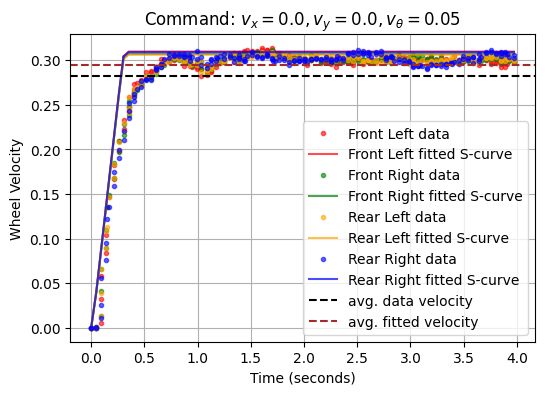

x_value:  0.9  y_value:  0.0  z_value:  0.0
Plotting results for x=0.9y=0.0z=0.0secs=4.0.csv
Total Velocity:  0.9
wheel velocity of x-movement command with same total velocity:  11.811023622047243
velocity command:  11.92845895685059
Total Velocity if this was straight command: 0.9089485725120151
factor bigger wheel velocity: 1.0099428583466834
a:  tensor(0.1884)  b:  tensor(1.3902)  target_slope:  tensor(7.3107)  sharpness1:  tensor(1.1103)  sharpness2:  tensor(2.0100)
velocity command:  11.933050130245372
Total Velocity if this was straight command: 0.9092984199246974
factor bigger wheel velocity: 1.0103315776941082
a:  tensor(0.1884)  b:  tensor(1.3902)  target_slope:  tensor(7.3107)  sharpness1:  tensor(1.1103)  sharpness2:  tensor(2.0100)
velocity command:  11.927471883970135
Total Velocity if this was straight command: 0.9088733575585244
factor bigger wheel velocity: 1.0098592861761382
a:  tensor(0.1884)  b:  tensor(1.3902)  target_slope:  tensor(7.3107)  sharpness1:  tensor(1.11

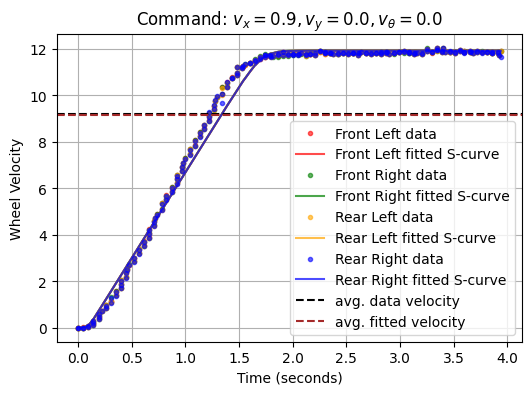

x_value:  0.625  y_value:  0.0  z_value:  0.0
Plotting results for x=0.625y=0.0z=0.0secs=4.0.csv
Total Velocity:  0.625
wheel velocity of x-movement command with same total velocity:  8.202099737532807
velocity command:  8.279677640136294
Total Velocity if this was straight command: 0.6309114361783856
factor bigger wheel velocity: 1.0094582978854172
a:  tensor(0.0898)  b:  tensor(1.1263)  target_slope:  tensor(6.3192)  sharpness1:  tensor(1.6499)  sharpness2:  tensor(2.0100)
velocity command:  8.279576410124767
Total Velocity if this was straight command: 0.6309037224515073
factor bigger wheel velocity: 1.0094459559224118
a:  tensor(0.0898)  b:  tensor(1.1263)  target_slope:  tensor(6.3192)  sharpness1:  tensor(1.6499)  sharpness2:  tensor(2.0100)
velocity command:  8.300053551792965
Total Velocity if this was straight command: 0.632464080646624
factor bigger wheel velocity: 1.0119425290345985
a:  tensor(0.0898)  b:  tensor(1.1263)  target_slope:  tensor(6.3192)  sharpness1:  tensor(1.

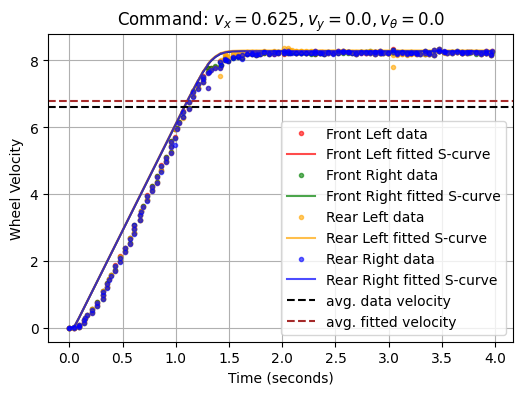

x_value:  1.1  y_value:  0.0  z_value:  0.0
Plotting results for x=0.55y=0.0z=0.0secs=4.0_reverse.csv
Total Velocity:  1.1
wheel velocity of x-movement command with same total velocity:  14.435695538057743
velocity command:  14.620933904301484
Total Velocity if this was straight command: 1.114115163507773
factor bigger wheel velocity: 1.0128319668252483
a:  tensor(0.2533)  b:  tensor(1.5396)  target_slope:  tensor(7.8178)  sharpness1:  tensor(0.8605)  sharpness2:  tensor(2.0100)
velocity command:  14.629969258672691
Total Velocity if this was straight command: 1.114803657510859
factor bigger wheel velocity: 1.0134578704644173
a:  tensor(0.2533)  b:  tensor(1.5396)  target_slope:  tensor(7.8178)  sharpness1:  tensor(0.8605)  sharpness2:  tensor(2.0100)
velocity command:  14.628780413241994
Total Velocity if this was straight command: 1.11471306748904
factor bigger wheel velocity: 1.013375515899127
a:  tensor(0.2533)  b:  tensor(1.5396)  target_slope:  tensor(7.8178)  sharpness1:  tensor

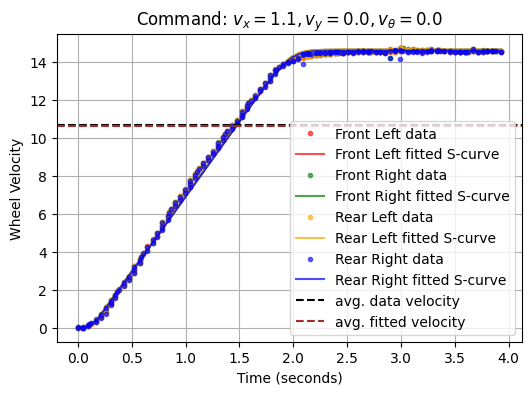

x_value:  0.875  y_value:  0.0  z_value:  0.0
Plotting results for x=0.875y=0.0z=0.0secs=4.0.csv
Total Velocity:  0.875
wheel velocity of x-movement command with same total velocity:  11.48293963254593
velocity command:  11.587156008574917
Total Velocity if this was straight command: 0.8829412878534088
factor bigger wheel velocity: 1.0090757575467528
a:  tensor(0.1796)  b:  tensor(1.3691)  target_slope:  tensor(7.2375)  sharpness1:  tensor(1.1508)  sharpness2:  tensor(2.0100)
velocity command:  11.586764440233733
Total Velocity if this was straight command: 0.8829114503458104
factor bigger wheel velocity: 1.0090416575380692
a:  tensor(0.1796)  b:  tensor(1.3691)  target_slope:  tensor(7.2375)  sharpness1:  tensor(1.1508)  sharpness2:  tensor(2.0100)
velocity command:  11.586142987998059
Total Velocity if this was straight command: 0.8828640956854521
factor bigger wheel velocity: 1.0089875379262312
a:  tensor(0.1796)  b:  tensor(1.3691)  target_slope:  tensor(7.2375)  sharpness1:  tenso

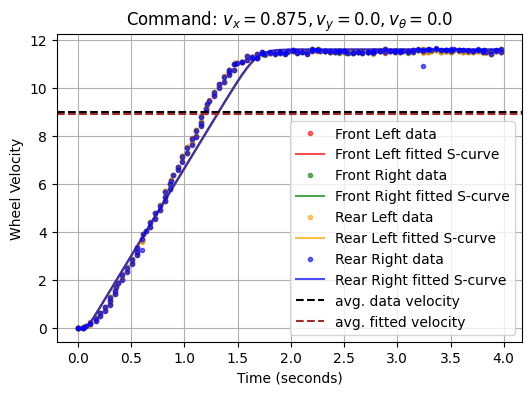

x_value:  0.15  y_value:  0.0  z_value:  0.0
Plotting results for x=0.075y=0.0z=0.0secs=4.0_reverse.csv
Total Velocity:  0.15
wheel velocity of x-movement command with same total velocity:  1.9685039370078736
velocity command:  1.9768466366200994
Total Velocity if this was straight command: 0.1506357137104516
factor bigger wheel velocity: 1.0042380914030107
a:  tensor(0.0206)  b:  tensor(0.5195)  target_slope:  tensor(3.0939)  sharpness1:  tensor(2.0096)  sharpness2:  tensor(2.0100)
velocity command:  1.985379543260948
Total Velocity if this was straight command: 0.15128592119648424
factor bigger wheel velocity: 1.0085728079765617
a:  tensor(0.0206)  b:  tensor(0.5195)  target_slope:  tensor(3.0939)  sharpness1:  tensor(2.0096)  sharpness2:  tensor(2.0100)
velocity command:  1.9852962890286037
Total Velocity if this was straight command: 0.1512795772239796
factor bigger wheel velocity: 1.0085305148265309
a:  tensor(0.0206)  b:  tensor(0.5195)  target_slope:  tensor(3.0939)  sharpness1:

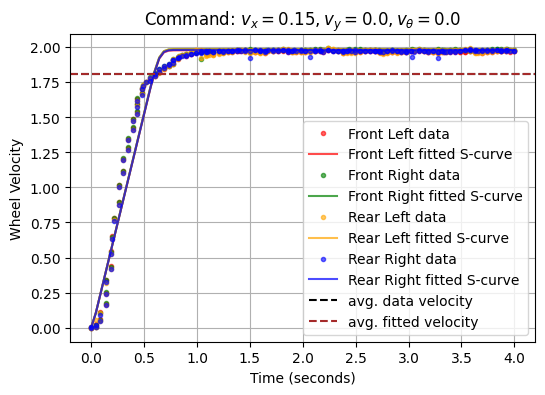

x_value:  0.0  y_value:  0.0  z_value:  1.4
Plotting results for x=0.0y=0.0z=0.7secs=4.0_reverse.csv
Total Velocity:  0.46293418953885873
wheel velocity of x-movement command with same total velocity:  6.075251831218618
velocity command:  8.638901467572953
Total Velocity if this was straight command: 0.6582842918290591
factor bigger wheel velocity: 1.4219824474074683
a:  tensor(0.0462)  b:  tensor(0.9419)  target_slope:  tensor(5.4740)  sharpness1:  tensor(1.9107)  sharpness2:  tensor(2.0100)
velocity command:  8.64413072328748
Total Velocity if this was straight command: 0.6586827611145061
factor bigger wheel velocity: 1.4228431945599822
a:  tensor(0.0462)  b:  tensor(0.9419)  target_slope:  tensor(5.4740)  sharpness1:  tensor(1.9107)  sharpness2:  tensor(2.0100)
velocity command:  8.653461445655775
Total Velocity if this was straight command: 0.6593937621589702
factor bigger wheel velocity: 1.4243790522704969
a:  tensor(0.0462)  b:  tensor(0.9419)  target_slope:  tensor(5.4740)  shar

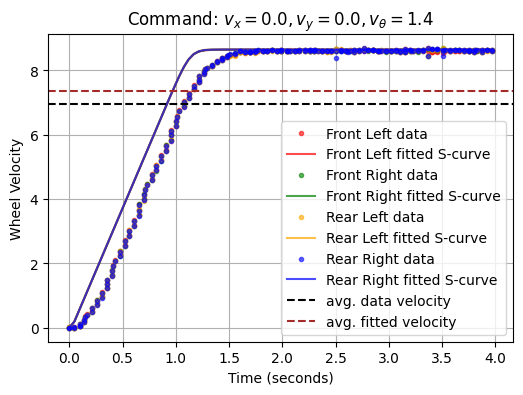

x_value:  0.125  y_value:  0.0  z_value:  0.0
Plotting results for x=0.125y=0.0z=0.0secs=4.0.csv
Total Velocity:  0.125
wheel velocity of x-movement command with same total velocity:  1.6404199475065615
velocity command:  1.65841748071671
Total Velocity if this was straight command: 0.1263714120306133
factor bigger wheel velocity: 1.0109712962449064
a:  tensor(0.0203)  b:  tensor(0.4657)  target_slope:  tensor(2.7721)  sharpness1:  tensor(2.0098)  sharpness2:  tensor(2.0100)
velocity command:  1.6587623959147462
Total Velocity if this was straight command: 0.12639769456870367
factor bigger wheel velocity: 1.0111815565496294
a:  tensor(0.0203)  b:  tensor(0.4657)  target_slope:  tensor(2.7721)  sharpness1:  tensor(2.0098)  sharpness2:  tensor(2.0100)
velocity command:  1.6588005454121506
Total Velocity if this was straight command: 0.1264006015604059
factor bigger wheel velocity: 1.0112048124832471
a:  tensor(0.0203)  b:  tensor(0.4657)  target_slope:  tensor(2.7721)  sharpness1:  tenso

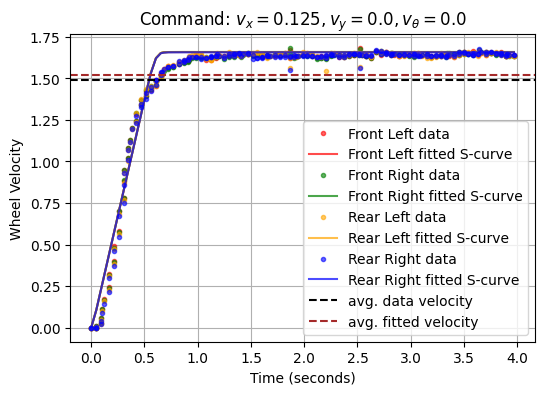

x_value:  0.0  y_value:  0.5  z_value:  0.0
Plotting results for x=0.0y=0.5z=0.0secs=4.0.csv
Total Velocity:  0.5
wheel velocity of x-movement command with same total velocity:  6.561679790026246
velocity command:  6.663278488514121
Total Velocity if this was straight command: 0.507741820824776
factor bigger wheel velocity: 1.015483641649552
a:  tensor(0.0542)  b:  tensor(0.9855)  target_slope:  tensor(5.6879)  sharpness1:  tensor(1.8667)  sharpness2:  tensor(2.0100)
velocity command:  6.666324186254919
Total Velocity if this was straight command: 0.5079739029926249
factor bigger wheel velocity: 1.0159478059852498
a:  tensor(0.0542)  b:  tensor(0.9855)  target_slope:  tensor(5.6879)  sharpness1:  tensor(1.8667)  sharpness2:  tensor(2.0100)
velocity command:  6.6618147975090976
Total Velocity if this was straight command: 0.5076302875701932
factor bigger wheel velocity: 1.0152605751403865
a:  tensor(0.0542)  b:  tensor(0.9855)  target_slope:  tensor(5.6879)  sharpness1:  tensor(1.8667) 

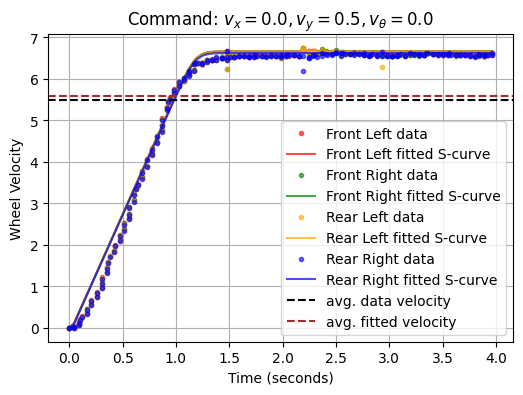

All data have been processed, plotted, and evaluated with the neural network.


In [28]:
import re

# model = torch.load(f"models/val_loss={best_overall_loss}.pth")
model = torch.load(f"models/val_loss=0.06954211084858368.pth")
# move model to device
model.to("cpu")

# Plotting results for the best model
for file_path in csv_files[::30]:
    # if "reverse" in file_path: # for testing purposes, skip reverse data
    #     continue
    
    pattern = r'x=(-?\d+\.?\d*)y=(-?\d+\.?\d*)z=(-?\d+\.?\d*)'

    # Use re.search to find the pattern in the file_path
    match = re.search(pattern, file_path)

    if match:
        x_value = float(match.group(1))
        y_value = float(match.group(2))
        z_value = float(match.group(3))
        if "reverse" in file_path: # for testing purposes, skip reverse data
            x_value *=2
            y_value *=2
            z_value *=2
    
    print("x_value: ", x_value, " y_value: ", y_value, " z_value: ", z_value)
        
    print(f"Plotting results for {os.path.basename(file_path)}")
    data = pd.read_csv(file_path)
    time = data['Time']
    adjusted_time = adjust_time(time)
    wheels = data.columns[1:]
    
    plt.figure(figsize=(6, 4))
    
    all_velocities = []
    all_fitted_curves = []
    

    total_velocity = np.sqrt((x_value -z_value * 0.22317)**2 + (y_value + z_value * 0.244)**2) 

    print("Total Velocity: ", total_velocity)
    print("wheel velocity of x-movement command with same total velocity: ", (1/(0.0762)) * total_velocity)
    
    wheel_color = ["red", "green", "orange", "blue"]
    only_one_wheel = False
    # Loop through each wheel and plot individual velocities and fitted curves
    for i, wheel in enumerate(wheels[:4]):
        velocities = process_velocities(data[wheel])[: len(adjusted_time)]
        target_velocity = extract_target_velocity(velocities)

        print("velocity command: ", target_velocity)
        print("Total Velocity if this was straight command:", (target_velocity *0.0762))
        
        
        
        
        all_velocities.append(velocities)
        
        if only_one_wheel:
            plt.plot(adjusted_time, velocities, 'o', label=f"data", markersize=3, alpha=0.6, color="blue")
        else:
            plt.plot(adjusted_time, velocities, 'o', label=f"{wheel} data", markersize=3, alpha=0.6, color=wheel_color[i])
        
        factor = target_velocity / ((1/(0.0762)) * total_velocity)
        print("factor bigger wheel velocity:", factor)
        with torch.no_grad():
            fitted_curve, *_= factor * np.array(model(torch.tensor(adjusted_time.values, dtype=torch.float32), torch.tensor([1/(0.0762) * total_velocity] * len(adjusted_time), dtype=torch.float32)))

        # with torch.no_grad():
        #     fitted_curve, *_= np.array(model(torch.tensor(adjusted_time.values, dtype=torch.float32), torch.tensor([target_velocity] * len(adjusted_time), dtype=torch.float32)))
            
        all_fitted_curves.append(fitted_curve)
        
        if only_one_wheel:
            plt.plot(adjusted_time, fitted_curve, '-', label=f"fitted S-curve", color="blue", alpha=0.7)
        else:
            plt.plot(adjusted_time, fitted_curve, '-', label=f"{wheel} fitted S-curve", color=wheel_color[i], alpha=0.7)
        
        if only_one_wheel:
            break
    
    # Calculate the average data velocity over all time steps
    avg_data_velocity = np.mean([np.mean(vel) for vel in all_velocities])
    
    # Calculate the average fitted velocity over all time steps
    avg_fitted_curve = np.mean([np.mean(curve) for curve in all_fitted_curves])
    
    # Plot horizontal lines for the average velocities
    plt.axhline(y=avg_data_velocity, color='black', linestyle='--', label="avg. data velocity")
    plt.axhline(y=avg_fitted_curve, color='brown', linestyle='--', label="avg. fitted velocity")
    
    plt.xlabel("Time (seconds)")
    plt.ylabel("Wheel Velocity")
    # plt.title(f"Wheel Velocities for {os.path.basename(file_path)} with Neural Network")
    plt.title(f"Command: $v_x={x_value}, v_y={y_value}, v_\\theta={z_value}$")
    plt.legend()
    plt.grid(True)
    if not os.path.exists("saved_plots"):
        os.makedirs("saved_plots")
    plt.savefig(f"saved_plots/{os.path.basename(file_path)}.pgf", format="pgf")  # Save as PGF (for LaTeX)
    plt.savefig(f"saved_plots/{os.path.basename(file_path)}.png")
    plt.show()
    

print("All data have been processed, plotted, and evaluated with the neural network.")


a:  tensor(0.0200, grad_fn=<SelectBackward0>)  b:  tensor(0.0881, grad_fn=<SelectBackward0>)  target_slope:  tensor(0.5084, grad_fn=<SelectBackward0>)  sharpness1:  tensor(2.0100, grad_fn=<SelectBackward0>)  sharpness2:  tensor(2.0100, grad_fn=<SelectBackward0>)
a:  tensor(0.0200, grad_fn=<SelectBackward0>)  b:  tensor(0.1684, grad_fn=<SelectBackward0>)  target_slope:  tensor(0.9906, grad_fn=<SelectBackward0>)  sharpness1:  tensor(2.0100, grad_fn=<SelectBackward0>)  sharpness2:  tensor(2.0100, grad_fn=<SelectBackward0>)
a:  tensor(0.0201, grad_fn=<SelectBackward0>)  b:  tensor(0.2754, grad_fn=<SelectBackward0>)  target_slope:  tensor(1.6318, grad_fn=<SelectBackward0>)  sharpness1:  tensor(2.0100, grad_fn=<SelectBackward0>)  sharpness2:  tensor(2.0100, grad_fn=<SelectBackward0>)
a:  tensor(0.0201, grad_fn=<SelectBackward0>)  b:  tensor(0.3796, grad_fn=<SelectBackward0>)  target_slope:  tensor(2.2569, grad_fn=<SelectBackward0>)  sharpness1:  tensor(2.0100, grad_fn=<SelectBackward0>)  sha

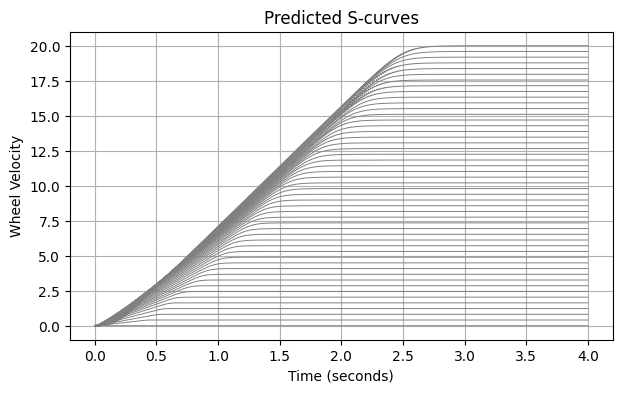

All fitted curves have been plotted together.


In [29]:

# Initialize figure for all fitted plots
plt.figure(figsize=(7, 4))

# # Loop over each file and plot fitted curves together
# for file_path in csv_files:
#     data = pd.read_csv(file_path)
#     time = data['Time']

#     adjusted_time = adjust_time(time)
#     wheels = data.columns[1:]
    
#     for wheel in wheels[:4]:
#         velocities = process_velocities(data[wheel])[: len(adjusted_time)]
#         target_velocity = extract_target_velocity(velocities)     
        
#         # Calculate fitted sigmoid curve
#         with torch.no_grad():
#             fitted_curve, *_ = model(torch.tensor(adjusted_time.values, dtype=torch.float32), torch.tensor([target_velocity] * len(adjusted_time), dtype=torch.float32))
#         # Plotting all fitted curves together
#         plt.plot(adjusted_time, fitted_curve, '-', label=f"{wheel} fitted sigmoid ({os.path.basename(file_path)})", 
#                  linewidth=0.1, color="grey")

time_values = np.linspace(0., 4, 1000)

for target_velocity in np.linspace(0., 20, 50):
    fitted_curve, *_ = model(torch.tensor(time_values, dtype=torch.float32), torch.tensor([target_velocity] * len(time_values), dtype=torch.float32))
    fitted_curve = fitted_curve.detach().numpy()
    plt.plot(time_values, fitted_curve, '-', label=f"{wheel} fitted sigmoid ({os.path.basename(file_path)})", 
                 linewidth=0.7, color="grey")



# Labeling the plot
plt.xlabel("Time (seconds)")
plt.ylabel("Wheel Velocity")
plt.title("Predicted S-curves")
# plt.legend(loc='upper right', fontsize='small', bbox_to_anchor=(1.2, 1.0))
plt.grid(True)
# plt.tight_layout()

plt.savefig(f"saved_plots/s_curves_predicted.pgf", format="pgf")  # Save as PGF (for LaTeX)
plt.savefig(f"saved_plots/s_curves_predicted.png")
plt.show()

print("All fitted curves have been plotted together.")

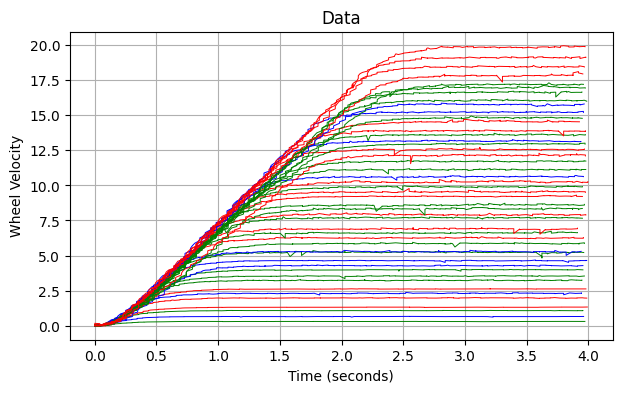

In [30]:
# Generate time values
time_values = np.linspace(0, 4, 100)  # 100 time points between 0 and 4 seconds
wheel_radius = 0.076  # Wheel radius in meters

# Define bins for the target velocities (50 bin edges, which gives 49 bins)
bins = np.linspace(0., 20, 50)
# Create a dictionary to store curves for each bin; keys correspond to bin indices
bin_curves = {i: [] for i in range(len(bins) - 1)}

# Process each CSV file
for file_path in csv_files:
    pattern = r'x=(-?\d+\.?\d*)y=(-?\d+\.?\d*)z=(-?\d+\.?\d*)'
    match = re.search(pattern, file_path)
    
    if match:
        x_value = float(match.group(1))
        y_value = float(match.group(2))
        z_value = float(match.group(3))
        if "reverse" in file_path:  # for testing purposes, skip reverse data
            x_value *= 2
            y_value *= 2
            z_value *= 2
    
    data = pd.read_csv(file_path)
    time = data['Time']
    adjusted_time = adjust_time(time)
    wheels = data.columns[1:]
    
    total_velocity = np.sqrt((x_value - z_value * 0.22317)**2 + (y_value + z_value * 0.244)**2)
    
    if x_value > 0:
        color = "red"
    if y_value > 0:
        color = "blue"
    if z_value > 0:
        color = "green"
    
    # Loop through each wheel and collect its curve data
    for wheel in wheels[1:4]:
        velocities = process_velocities(data[wheel])[: len(adjusted_time)]
        target_velocity = extract_target_velocity(velocities)
        
        # Optionally compute a factor (not used for plotting in this snippet)
        if total_velocity != 0:
            factor = target_velocity / ((1 / 0.0762) * total_velocity)
        else:
            factor = 1
        
        # Determine the bin index for the target_velocity
        bin_index = np.digitize(target_velocity, bins) - 1
        # Only include curves with a target_velocity that falls within our bins
        if 0 <= bin_index < (len(bins) - 1):
            label = f"{wheel} data ({os.path.basename(file_path)})"
            # Save the curve data (time, velocities, and label)
            bin_curves[bin_index].append((adjusted_time, velocities, label, color))

# Now, plot one random curve from each bin (if available)
fig, ax = plt.subplots(figsize=(7, 4))
for bin_index, curves in bin_curves.items():
    if curves:  # if the bin is not empty
        chosen_curve = random.choice(curves)
        adjusted_time, velocities, label, color = chosen_curve
        ax.plot(adjusted_time, velocities, '-', label=label, alpha=1, linewidth=0.7, color=color)

# Labeling the plot
ax.set_xlabel("Time (seconds)")
ax.set_ylabel("Wheel Velocity")
ax.set_title("Data")
ax.grid(True)
# ax.set_aspect(1)
# ax.set_ylim(0, 20)


plt.savefig(f"saved_plots/s_curve_data.pgf", format="pgf")  # Save as PGF (for LaTeX)
plt.savefig(f"saved_plots/s_curve_data.png")

plt.show()

In [31]:

# Now, initialize the animation plot
line, = ax.plot([], [], lw=2, color='red')  # Animated curve will be red

# Initialize the plot function for animation
def init():
    line.set_data([], [])
    return line,

# Update function for animation
def update(frame):
    global target_velocity
    
    # Set the current target_velocity (time t = target_velocity)
    target_velocity = frame

    fitted_curve, *_ = model(torch.tensor(time_values, dtype=torch.float32), torch.tensor([target_velocity] * len(time_values), dtype=torch.float32))
    fitted_curve = fitted_curve.detach().numpy()
    # Update the line plot with new data for the animated curve
    line.set_data(time_values, fitted_curve)
    ax.set_title(f"Target Velocity = {target_velocity:.1f}")
    return line,

# Create the animation
ani = FuncAnimation(fig, update, frames=np.linspace(0., 27, 50),
                    init_func=init, blit=True, repeat=False)

# Display the animation inline in the Jupyter Notebook
HTML(ani.to_jshtml())

a:  tensor(0.0200, grad_fn=<SelectBackward0>)  b:  tensor(0.0881, grad_fn=<SelectBackward0>)  target_slope:  tensor(0.5084, grad_fn=<SelectBackward0>)  sharpness1:  tensor(2.0100, grad_fn=<SelectBackward0>)  sharpness2:  tensor(2.0100, grad_fn=<SelectBackward0>)
a:  tensor(0.0200, grad_fn=<SelectBackward0>)  b:  tensor(0.2043, grad_fn=<SelectBackward0>)  target_slope:  tensor(1.2055, grad_fn=<SelectBackward0>)  sharpness1:  tensor(2.0100, grad_fn=<SelectBackward0>)  sharpness2:  tensor(2.0100, grad_fn=<SelectBackward0>)
a:  tensor(0.0201, grad_fn=<SelectBackward0>)  b:  tensor(0.3501, grad_fn=<SelectBackward0>)  target_slope:  tensor(2.0798, grad_fn=<SelectBackward0>)  sharpness1:  tensor(2.0100, grad_fn=<SelectBackward0>)  sharpness2:  tensor(2.0100, grad_fn=<SelectBackward0>)
a:  tensor(0.0203, grad_fn=<SelectBackward0>)  b:  tensor(0.4680, grad_fn=<SelectBackward0>)  target_slope:  tensor(2.7857, grad_fn=<SelectBackward0>)  sharpness1:  tensor(2.0098, grad_fn=<SelectBackward0>)  sha

In [32]:
# Export model as string to easily use it in the code for the Isaac Sim extension.

# Create a BytesIO buffer to save the model weights
buffer = io.BytesIO()

# Save the model's state_dict to the buffer
torch.save(model.state_dict(), buffer)

# Convert the buffer content to a byte string
buffered_model = buffer.getvalue()

# Now you have the model weights as a byte string
model_string = buffered_model.hex()  # Convert bytes to a hex string
print(model_string)


504b03040000080800000000000000000000000000000000000010001200617263686976652f646174612e706b6c46420e005a5a5a5a5a5a5a5a5a5a5a5a5a5a800263636f6c6c656374696f6e730a4f726465726564446963740a71002952710128580a0000006663312e776569676874710263746f7263682e5f7574696c730a5f72656275696c645f74656e736f725f76320a71032828580700000073746f72616765710463746f7263680a466c6f617453746f726167650a71055801000000307106580300000063707571074b23747108514b004b234b018671094b014b0186710a8968002952710b74710c52710d58080000006663312e62696173710e6803282868046805580100000031710f68074b23747110514b004b238571114b0185711289680029527113747114527115580a0000006663322e77656967687471166803282868046805580100000032711768074d0d02747118514b004b0f4b238671194b234b0186711a8968002952711b74711c52711d58080000006663322e62696173711e6803282868046805580100000033711f68074b0f747120514b004b0f8571214b0185712289680029527123747124527125580a0000006663332e77656967687471266803282868046805580100000034712768074b4b747128514b004b054b0f8671294b0f4b0186712a896800